# Анализ рынка заведений общественного питания Москвы.

<div style="border:solid black 1px; padding: 20px">
    
***Заказчик:***
Фонд «Shut Up and Take My Money»
    
***Вводные:***
Инвесторы из фонда решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
    
***Задача:***
- Подготовить исследования рынка 
- Найти интересные особенности, которые в будущем помогут в выборе подходящего инвесторам места
- Презентовать полученные результаты

***Входные данные:***
- датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года
</div>

### Обзор данных

#### Импортируем необходимые для работы библиотеки

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import json
import folium
from folium import Map, Marker
from folium.plugins import MarkerCluster

#### Считываем файл с данными и сохраняем в переменной data

In [2]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('moscow_places.csv')

#### Проведем обзор данных, изучим кол-во пропусков, дубликатов, посмотрим на статистики и выбросы

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


***Посмотрим на количество и долю пропусков***

In [5]:
display(pd.concat([data.isna().sum(), data.isna().mean()], axis=1)\
    .rename(columns={0:'кол-во пропусков', 1:'доля пропусков'})\
    .style.format({'кол-во пропусков':'{:.0f}', 'доля пропусков':'{:.2%}'}))

,кол-во пропусков,доля пропусков
name,0,0.00%
category,0,0.00%
address,0,0.00%
district,0,0.00%
hours,536,6.38%
lat,0,0.00%
lng,0,0.00%
rating,0,0.00%
price,5091,60.56%
avg_bill,4590,54.60%


***Узнаем также кол-во и долю дубликатов***

In [6]:
display(data.duplicated().sum())
data.duplicated().sum() / len(data)

0

0.0

In [7]:
data['name'] = data['name'].str.lower()

In [8]:
data['key'] = data['address'] + data['name']

In [9]:
duplicate_rows = data[data.duplicated(['key'], keep=False)]
duplicate_rows

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,key
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0,"Москва, Волоколамское шоссе, 11, стр. 2more poke"
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,"Москва, Волоколамское шоссе, 11, стр. 2more poke"
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0,"Москва, проспект Мира, 118раковарня клешни и х..."
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0,"Москва, проспект Мира, 118раковарня клешни и х..."
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0,"Москва, Ярцевская улица, 19хлеб да выпечка"
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0,"Москва, Ярцевская улица, 19хлеб да выпечка"


***Посмотрим на кол-во уникальных значений в таблице***

In [10]:
data.nunique()

name                 5512
category                8
address              5753
district                9
hours                1307
lat                  8209
lng                  8258
rating                 41
price                   4
avg_bill              897
middle_avg_bill       230
middle_coffee_cup      96
chain                   2
seats                 229
key                  8403
dtype: int64

***Изучим уникальные значения***

In [11]:
display(data['chain'].unique())
display(data['district'].unique())
data['category'].unique()

array([0, 1])

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

***Посмотрим подробнее на статистики столбцов датафрейма, а также изучим выбросы***

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

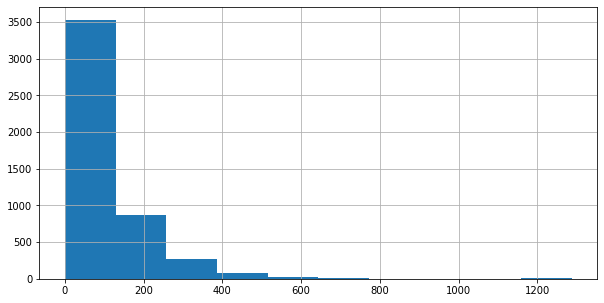

In [12]:
display(data['seats'].describe())
data['seats'].hist(figsize=(10, 5));

In [13]:
display(data.loc[data['seats'] == 0, 'seats'].count())
data.loc[data['seats'] > 1000, 'seats'].count()

136

16

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

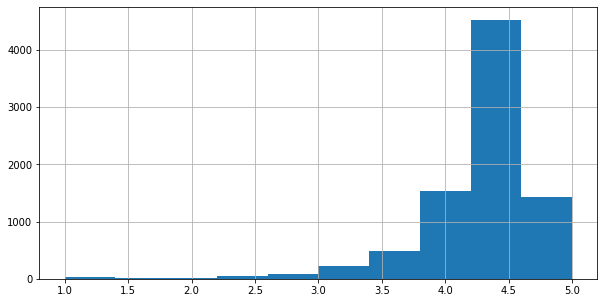

In [14]:
display(data['rating'].describe())
data['rating'].hist(figsize=(10, 5));

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

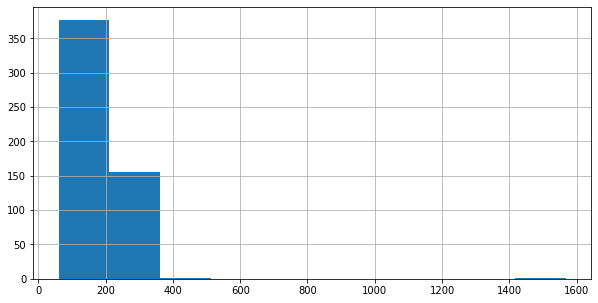

In [15]:
display(data['middle_coffee_cup'].describe())
data['middle_coffee_cup'].hist(figsize=(10, 5));

In [16]:
data.loc[data['middle_coffee_cup'] > 1000, 'middle_coffee_cup'].count()

1

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

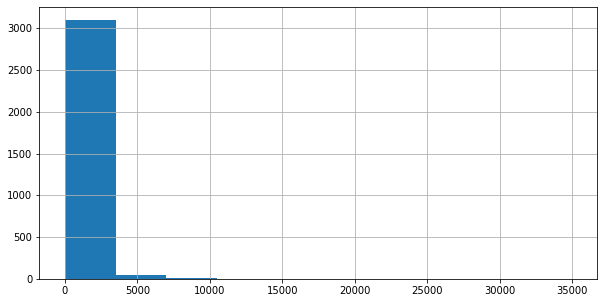

In [17]:
display(data['middle_avg_bill'].describe())
data['middle_avg_bill'].hist(figsize=(10, 5));

In [18]:
data.loc[data['middle_avg_bill'] > 10000, 'middle_avg_bill'].count()

2

<div style="border:solid green 2px; padding: 20px">
В таблице 8406 строк. В некоторых столбцах присутствует довольно большое кол-во пропусков, более 60%, а в стобце middle_coffee_cup доля пропусков более 93%. Дубликатов в датафрейме не обнаружено. В столбцах с данными есть небольшое количество аномальных значений. Удалить или надежно заполнить такое большое кол-во пропусков не получится, не исказив при этом результаты, поэтому оставим значения как есть, дополнительно для анализа создадим столбец с названием улиц(data['street']) и столбец с обозначением, что заведение работает ежедневно и круглосуточно(data['is_24/7'])
</div>

### Предобработка данных

#### Добавим столбец street, в который вынесем название улиц

In [19]:
street_types = ['улица', 'бульвар', 'проспект', 'переулок', 'шоссе', 
'проезд', 'набережная', 'площадь', 'аллея', 'линия', 'квартал', 'мост', 'тупик', 'просека']
def street_finder(address):
    for address_part in address.split(', '):
        for street_type in street_types:
            if address_part.lower().find(street_type)!= -1:
                return address_part

data['street'] = data['address'].apply(street_finder)

In [20]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,key,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,"Москва, улица Дыбенко, 7/1wowфли",улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,"Москва, улица Дыбенко, 36, корп. 1четыре комнаты",улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,"Москва, Клязьминская улица, 15хазри",Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,"Москва, улица Маршала Федоренко, 12dormouse co...",улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,"Москва, Правобережная улица, 1Биль марко",Правобережная улица


#### Добавим столбец с обозначением, что заведение работает 24/7

In [21]:
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'

In [22]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,key,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,"Москва, улица Дыбенко, 7/1wowфли",улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,"Москва, улица Дыбенко, 36, корп. 1четыре комнаты",улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,"Москва, Клязьминская улица, 15хазри",Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,"Москва, улица Маршала Федоренко, 12dormouse co...",улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,"Москва, Правобережная улица, 1Биль марко",Правобережная улица,False


<div style="border:solid green 2px; padding: 20px">
Как мы и говорили ранее, из за большого кол-ва пропусков мы не можем корректно заменить значения, не повлияв на конечный результат, поэтому оставляем все пропущенные строки без изменений. Мы создали два дополнительных столбца которые потребуются нам для дальнейшего исследования. Можно приступать к анализу данных.
</div>

### Анализ данных

#### Изучим количество объектов общественного питания по категориям

In [23]:
data_by_category = (
    data
    .groupby('category')
    .agg(count=('name','count'))
    .reset_index()
    .sort_values('count', ascending=False)
)

data_by_category['share'] = round(data_by_category['count'] / sum(data_by_category['count']) * 100, 2)

data_by_category

,category,count,share
3,кафе,2378,28.29
6,ресторан,2043,24.30
4,кофейня,1413,16.81
0,"бар,паб",765,9.10
5,пиццерия,633,7.53
2,быстрое питание,603,7.17
7,столовая,315,3.75
1,булочная,256,3.05


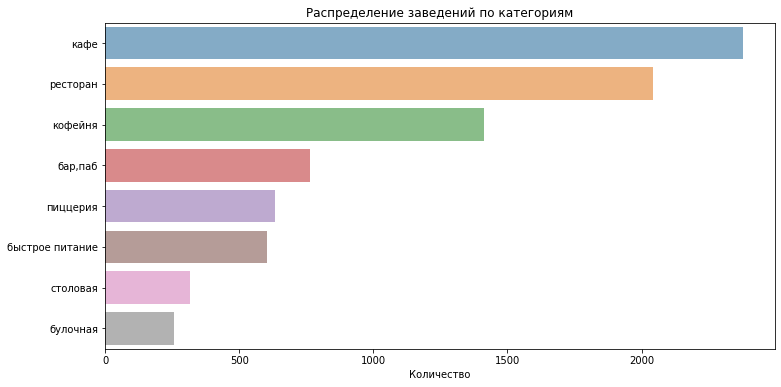

In [24]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='count', y='category', 
                 data=data_by_category, 
                 orient='h', alpha=0.6)
ax.set_title('Распределение заведений по категориям')
ax.set_xlabel('Количество') 
ax.set_ylabel('')
plt.show()

*Как можно заметить из полученных выше результатов, по количеству лидирует категория "кафе" - 2378шт, более 28% от общего кол-ва заведений. На втором месте рестораны - чуть больше 2000шт и занимаемой долей в 24%. Кофеен чуть меньше полутора тысяч, доля рынка - около 17%. Меньше всего столовых и булочных - 3-4%*

#### Исследуем количество посадочных мест в заведениях по категориям

In [25]:
data_by_seats = (
    round(
    data
    .groupby('category')
    .agg(mean=('seats','mean'))
    .reset_index()
    .sort_values('mean', ascending=False), 
    2)
)

data_by_seats

,category,mean
0,"бар,паб",124.53
6,ресторан,121.94
4,кофейня,111.20
7,столовая,99.75
2,быстрое питание,98.89
3,кафе,97.51
5,пиццерия,94.50
1,булочная,89.39


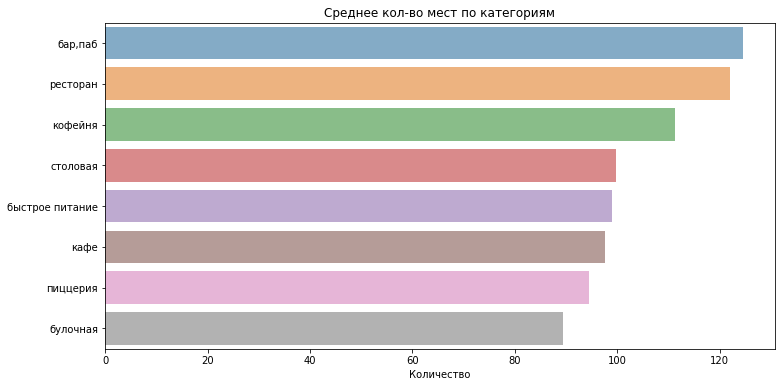

In [26]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='mean', y='category', 
                 data=data_by_seats, 
                 orient='h', alpha=0.6)
ax.set_title('Среднее кол-во мест по категориям')
ax.set_xlabel('Количество') 
ax.set_ylabel('')
plt.show()

*Лидерами по среднему кол-ву посадочных мест являются категории "бар, паб" и "ресторан", средняя вместимость 124 и 122 места*, кофейни в среднем вмещают около 111 посетителей, остальные категории в среднем могут принять от 80 до 100 гостей.*

#### Рассмотрим соотношение сетевых и несетевых заведений

In [27]:
data_by_chain = data.groupby('chain').agg(count=('name','count')).reset_index()
display(data_by_chain)

,chain,count
0,0,5201
1,1,3205


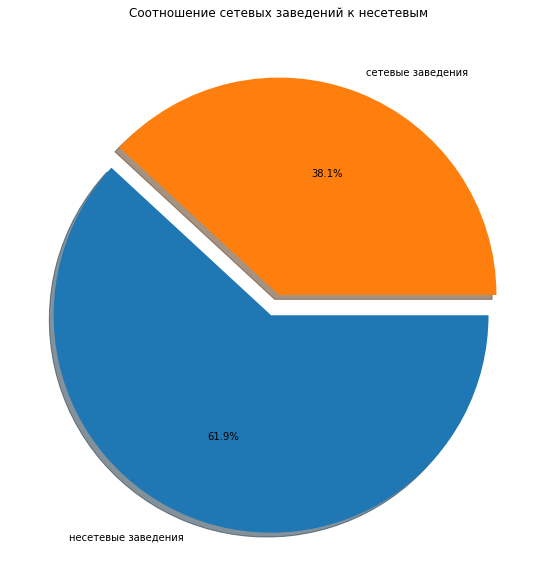

In [28]:
plt.figure(figsize=(10, 10))
explode = (0.1, 0)
plt.pie(data_by_chain['count'],
        labels=data_by_chain['chain'].map({1: 'сетевые заведения', 0: 'несетевые заведения'}), 
        explode=explode, 
        autopct='%1.1f%%',
        counterclock=0, 
        shadow=1)
plt.title('Соотношение сетевых заведений к несетевым')
plt.show()

*Как видно на круговой диаграмме, почти 62% заведений не сетевые.*

#### Изучим какие из категорий чаще бывают сетевыми

,category,chain_count,total_count,%
1,булочная,157,256,61.328125
5,пиццерия,330,633,52.132701
4,кофейня,720,1413,50.955414
2,быстрое питание,232,603,38.474295
6,ресторан,730,2043,35.731767
3,кафе,779,2378,32.758621
7,столовая,88,315,27.936508
0,"бар,паб",169,765,22.091503


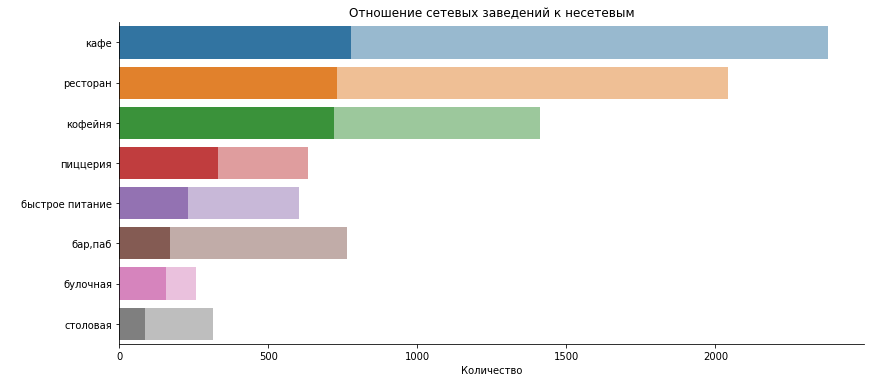

In [29]:
data_chain_type = data.groupby('category').agg({'chain' : 'sum',
                                'name' : 'count'}).reset_index()
data_chain_type.columns = ['category', 'chain_count', 'total_count']
data_chain_type['%'] = data_chain_type['chain_count'] / data_chain_type['total_count'] * 100
data_chain_type = data_chain_type.sort_values('chain_count', ascending=False)
display(data_chain_type.sort_values(by='%', ascending=False))

ax = sns.catplot(data=data_chain_type, 
                 kind="bar", 
                 x="chain_count", 
                 y="category",               
                 alpha=1, 
                 aspect=12/5)
ax1 = sns.barplot(x='total_count', y='category', data=data_chain_type, alpha=0.5,  orient='h')
ax.set_axis_labels('Количество', ' ')
plt.title('Отношение сетевых заведений к несетевым')
plt.show()

*Больше всего сетевых заедений по общему кол-ву в категориях кафе, ресторан и кофейня - более 700шт в каждой. По соотношению сетевых и несетевых заведений лидерами являются категории булочная - 61% в этой категории сетевые, пиццерия - 52% сетевых заведений,  и кофейня - 51%.*

#### Найдем топ-15 популярных сетей в Москве

In [30]:
data_top = (
    data
    .query('chain == 1')
    .groupby(['name', 'category'])
    .agg(count=('name','count'))
    .sort_values('count', ascending=False)
    .head(15)
    .reset_index()
)

data_top

,name,category,count
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,36


In [31]:
fig = px.bar(data_top, x='count', y='name', color='category', title='Кол-во заведений каждой категории по районам')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.update_xaxes()
fig.show()

*Как мы можем увидеть из полученных данных, самой большой сетью является кофейня Шоколадница - 120 заведений в Москве. Далее идут пиццерии Домино'с Пицца, Додо Пицца и кофейня One Price Coffee, кол-во заведений - 76, 74 и 71. В нашем топ-15 самыми небольшими сетями являются кофейня Кофемания - 22 заведения, булочная Буханка - 25 заведений и кафе Drive Café - 24 заведения. Все представленные на графике сети - являются кафе,ресторанами или кофейнями, довольно часто представлены в крупных ТЦ Москвы*

#### Исследуем, какие административные районы Москвы присутствуют в датасете? Посмотрим на общее количество заведений и количество заведений каждой категории по районам

In [32]:
data_cat = (
data
.groupby(['category', 'district'])
.agg(count=('name','count'))
.sort_values(by=['category','count'])
.reset_index()
)

fig = px.bar(data_cat, x='count', y='district', color='category', title='Кол-во заведений каждой категории по районам')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.update_xaxes()
fig.show()

*Среди разных районов Москвы, по кол-ву заведений лидирует ЦАО, самыми популярными категорями являются кафе, рестораны и кофейни*

#### Визуализируем распределение средних рейтингов по категориям заведений

In [33]:
rating_mean = (
    data
    .groupby('category')
    .agg(mean=('rating','mean'))
    .sort_values('mean', ascending=False)
    .reset_index()
)
rating_mean

,category,mean
0,"бар,паб",4.387712
1,пиццерия,4.301264
2,ресторан,4.290357
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.123886
7,быстрое питание,4.050249


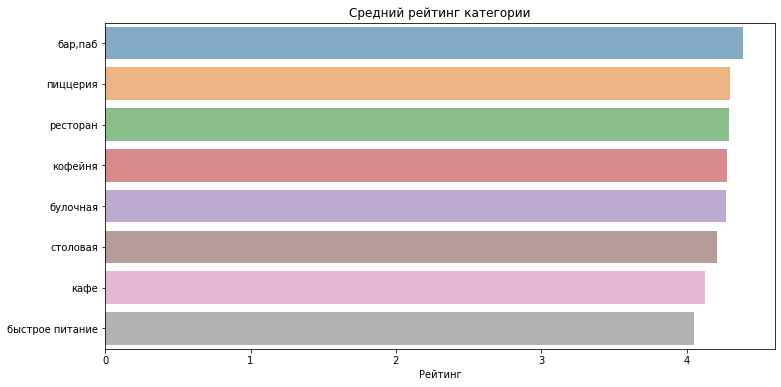

In [34]:
plt.figure(figsize=(12, 6))
ax = sns.barplot(x='mean', y='category', 
                 data=rating_mean, 
                 orient='h', alpha=0.6)
ax.set_title('Средний рейтинг категории')
ax.set_xlabel('Рейтинг') 
ax.set_ylabel('')
plt.show()

*Можно сделать вывод, что средний рейтинг в разных категорях общепита различается не значительно, от 4 до 4.4 баллов*

#### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [35]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [36]:
rating_dis = data.groupby('district', as_index=False)['rating'].agg('median')
rating_dis.sort_values('rating', ascending=False)

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


In [37]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_dis,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

*Срединй рейтинг по районам Москвы 4.2 - 4.4 балла. Где лучшие заведения? У нас в центре! В ЦАО самая высокая средняя оценка.*

#### Отобразим все заведения датасета на карте

In [38]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

*Чем дальше от центра, тем меньше заведений, на рейтинге это тоже сказывается*

#### Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.

In [39]:
data_street = (
    data
    .groupby('street')
    .agg(count=('name', 'count'))
    .sort_values('count', ascending=False)
    .reset_index()
    .head(15)
)
data_street

,street,count
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,Люблинская улица,60


In [40]:
data_top15 = data[data['street'].isin(data_street['street'])]
data_top15.head(5)


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,key,street,is_24/7
8,donna maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,"Москва, Дмитровское шоссе, 107, корп. 4donna m...",Дмитровское шоссе,False
17,чайхана беш-бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,"Москва, Ленинградское шоссе, 71Б, стр. 2чайхан...",Ленинградское шоссе,True
26,пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,"Москва, Дмитровское шоссе, 107к2пикочино",Дмитровское шоссе,False
29,кушай город,столовая,"Москва, Дмитровское шоссе, 157, стр. 15",Северный административный округ,пн-пт 09:00–16:00,55.898414,37.539256,4.2,средние,Средний счёт:200–250 ₽,225.0,NaN,1,NaN,"Москва, Дмитровское шоссе, 157, стр. 15кушай г...",Дмитровское шоссе,False
43,суши & пицца,ресторан,"Москва, Дмитровское шоссе, 169, корп. 6",Северо-Восточный административный округ,"ежедневно, 10:00–23:00",55.928943,37.540548,4.0,NaN,NaN,NaN,NaN,0,NaN,"Москва, Дмитровское шоссе, 169, корп. 6суши & ...",Дмитровское шоссе,False


In [41]:
data_st15 = (
    data_top15
    .groupby(['category', 'street'])
    .agg(count=('name','count'))
    .sort_values('count', ascending=False)
    .reset_index()
)

In [42]:
fig = px.bar(data_st15, x='count', y='street', color='category', title='Кол-во заведений по категориям, топ-15 улиц')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.update_xaxes
fig.show()

*Как можно заметить из полученных результатов, больше всего заведений располагается на проспектах Мира, Ленинградском, Ленинском, Вернандского, Профсоюзной улице и Дмитровском шоссе, а лидерами среди категорий являются кафе, рестораны и кофейни.*

#### Найдем улицы, на которых находится только один объект общепита

In [43]:
data_street_one = (
    data
    .groupby('street')
    .agg(count=('name', 'count'))
    .reset_index()
)
data_street_one = data_street_one.query('count == 1')

In [44]:
data_one = data[data['street'].isin(data_street_one['street'])]

In [45]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_one.apply(create_clusters, axis=1)

# выводим карту
m

In [46]:
data_one.groupby('category').agg(count=('name','count')).sort_values('count', ascending=False)

,count
category,
кафе,145
ресторан,91
кофейня,75
"бар,паб",40
столовая,36
быстрое питание,18
пиццерия,14
булочная,9


In [47]:
data_one_chain = data_one.groupby('chain').agg(count=('name','count')).reset_index()
display(data_one_chain)

,chain,count
0,0,313
1,1,115


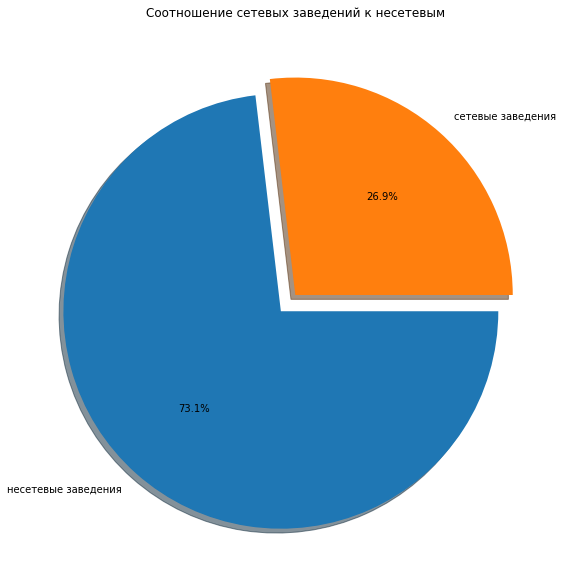

In [48]:
plt.figure(figsize=(10, 10))
explode = (0.1, 0)
plt.pie(data_one_chain['count'],
        labels=data_one_chain['chain'].map({1: 'сетевые заведения', 0: 'несетевые заведения'}), 
        explode=explode, 
        autopct='%1.1f%%',
        counterclock=0, 
        shadow=1)
plt.title('Соотношение сетевых заведений к несетевым')
plt.show()

*Исходя из полученных результатов можно сказать, что есть около 430 улиц на которых находится по одному заведению, большинство этих заведений относятся к категории "кафе" - 145шт, большая часть из них находится вдали от центра Москвы, и подавляющая часть заведений является не сетевыми(73%)*

#### Посчитаем медиану столбца с данными о среднем чеке в заведениях, построим хороплет с полученными значениями для каждого района 

In [49]:
data_median_dis = data.groupby('district').agg(median=('middle_avg_bill', 'median')).reset_index()
data_median_dis.sort_values('median', ascending=False)

,district,median
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [50]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_median_dis,
    columns=['district', 'median'],
    key_on='feature.name',
    legend_name='Медианный чек заведений по районам',
).add_to(m)

# выводим карту
m

*Центральный административный округ лидирует по медианному чеку заказа - 1000р, удаленность от центра в большинстве случаев влияет на чек, исключение составляют заведения находящиеся в ЗАО, здесь медианное значение такое же как у ЦАО - 1000р. В ЮАО и ЮВАО средний чек самый низкий - 450р*

#### Вывод

<div style="border:solid green 2px; padding: 20px">
    

***Мы проанализировали данные о рынке общественного питания Москвы за лето 2022 года, на основе полученных результатов, можно резюмировать следующие тезисы:***
    
    
    
- Заведения общественного питания Москвы делятся на несколько категорий: кафе, бар, ресторан, кофейня, пиццерия, быстрое питание, булочная, столовая. Кафе - самая распространенная категория - 2378шт, более 28% от общего кол-ва заведений. На втором месте рестораны - чуть больше 2000шт и занимаемой долей в 24%. Кофеен чуть меньше полутора тысяч, доля рынка - около 17%. Меньше всего столовых и булочных - 3-4%.
    
    
- Больше всего на рынке несетевых заведений - более 61% от общего кол-ва. Кафе, рестораны и кофейни чаще всего бывают сетевыми - более 700 заведений в каждой из категорий. К несетевым заведениям чаще всего относятся булочные, бары, столовые - в этих категориях кол-во заведений не превышает 200шт.
Самые популярные и большие сети в Москве: Шоколадница - 120 заведений, Домино'с Пицца - 76, Додо Пицца - 74. К небольшим сетям относятся: Му-Му - 27, Буханка - 31, CofeFest - 31 заведение. Представители сетевых заведений в основном предприятия быстрого обслуживания, часто представлены в крупных ТЦ Москвы.
    
    
- Лидерами по среднему кол-ву посадочных мест являются категории "бар, паб" и "ресторан", средняя вместимость 124 и 122 места, кофейни в среднем вмещают около 111 посетителей, остальные категории в среднем могут принять от 80 до 100 гостей.
    
    
- Средняя оценка заведений находится в диапазоне 4.2 - 4.4, лидирует ЦАО.
    
    
- Улицы из ТОП-15 по кол-ву заведений, имеют протяженность через несколько районов. Больше всего заведений располагается на проспектах Мира, Ленинградском, Ленинском, Вернандского, Профсоюзной улице и Дмитровском шоссе, а лидерами среди категорий являются кафе, рестораны и кофейни. 
Улицы с единственными заведениями чаще всего находятся на удалении от центра Москвы, большинство заведений являются не сетевыми(73%)
    
    
- Самый большой медианный чек в заведениях ЦАО и ЗАО - 1000руб, наименьшие показатели медианного чека в ЮАО и ЮВАО - 450руб.
    
    
***Рекомендации***
    
Самой перспективной категорией является кафе. Можно ограничиться 80-100 посадочными местами, лучшее расположение будет ЦАО - улицы с высокой проходимостью и большим кол-вом туристов. Учитывая поток людей и высокий медианный чек в этом районе(1000руб) - можно рассчитывать хорошую посадку и выручку заведения. Осталось придумать классную "фичу" чтобы привлечь к себе внимание. Как насчет робо-котов?
</div>

### Открытие кофейни

<div style="border:solid black 1px; padding: 20px">


***Проведем небольшое исследование и выясним важные моменты для открытия кофейни:***
    
    
- изучим общее кол-во кофеен и кол-во круглосуточных заведений этой категории
- посмотрим на особенности расположения кофеен
- изучим рейтинги кофеен, стоимость чашки кофе в разных районах Москвы
</div>

***Общее кол-во кофеен***

In [51]:
data_coffee = data.query('category == "кофейня"')
data_coffee['name'].count()

1413

***Из них круглосуточных***

In [52]:
len(data_coffee.loc[data_coffee['is_24/7'] == True])

59

***Доля круглосуточных кофеен***

In [53]:
round(len(data_coffee.loc[data_coffee['is_24/7'] == True]) / data_coffee['name'].count(), 2)

0.04

***Особенности расположения кофеен***

In [54]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffee.apply(create_clusters, axis=1)

# выводим карту
m

***Среднее число посадочных мест***

In [55]:
data_coffee['seats'].median()

80.0

***Доля сетевых кофеен***

In [56]:
round(data_coffee['chain'].sum() / len(data_coffee['chain']), 2)

0.51

In [57]:
data_coffee_top = (
    data_coffee
    .query('chain == 1')
    .groupby('name')
    .agg(count=('name','count'))
    .sort_values('count', ascending=False)
    .head(5)
    .reset_index()
)

data_coffee_top

,name,count
0,шоколадница,119
1,one price coffee,71
2,cofix,65
3,кофепорт,42
4,cofefest,31


*На лето 2022 года, в Москве насчитывается более 1400 кофеен, из которых 59 круглосуточных. Основное месторасположение - Центральный район Москвы, в среднем это заведения на 80 посадочных мест, чуть больше половины являются сетевыми заведениями. Топ-5 это Шоколадница, One Price Coffee, Cofix, КОФЕПОРТ и CofeFest*

***Медианный рейтинг кофеен***

In [58]:
rating_coffee = (
    data_coffee
    .groupby('district', as_index=False)['rating']
    .agg('mean')
    .sort_values('rating', ascending=False)
)
rating_coffee

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


*Медианный рейтинг кофеен по округам довольно близок, диапазон 4.19 - 4.33 балла*

In [59]:
Choropleth(
    geo_data=state_geo,
    data=rating_coffee,
    columns=['district', 'rating'],
    key_on='feature.name',
    legend_name='Рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

*Как мы можем заметить, выделяются только ЗАО и СВАО, здесь медианный рейтинг кофеен ниже чем в других округах Москвы*

***Медианный чек за чашку кофе***

In [60]:
data_coffee_dis = data_coffee.groupby('district').agg(median=('middle_coffee_cup', 'median')).reset_index()
data_coffee_dis.sort_values('median', ascending=False)

,district,median
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


***Медианная стоимость чашки кофе по районам***

In [61]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_coffee_dis,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

*Исходя из полученных результатов, можно сказать что лучший медианный чек за чашку капучино в ЦАО, ЮЗАО и ЗАО, от 190 до 200руб, самая низкая цена в ВАО - 135руб*

<div style="border:solid green 2px; padding: 20px">
   
    
***Мы провели небольшое исследования данных и выяснили важные моменты для открытия кофейни:***
    

- на лето 2022 в Москве 1413 кофеен из которых 59 работают круглосуточно
- среднее число посадочных мест - около 80
- большинство кофеен располагается в центральном округе Москвы
- средний рейтинг кофеен находится в диапазоне 4.2 - 4.3 балла
- половина кофеен сетевые, а лидерами среди них являются Шоколадница, One Price Coffee, Cofix, КОФЕПОРТ и CofeFest
- медианная стоимость чашки кофе зависит от места расположения кофейни, в центральном и западных районах Москвы чек самый высокий от 165 до 198руб
    
    
***Рекомендации***
    
Лучшая локация для открытия кофейни будет центральный район Москвы, высокая проходимость обеспечит хороший наплыв посетителей, плюс ко всему, медианная стоимость чашки капучино в центральном районе одна из самых высоких. Кофейня может работать круглосуточно, это обеспечит хорошую конкуретную способность среди большинства других заведений этой категории, которые предпочитают стандартный режим работы. Лучше открывать небольшую аутентичную кофейню. Стоит подробнее изучить топовые сетевые заведения и подумать над отличительной интересной чертой, которая привлечет больше клиентов и послужит "визитной карточкой" заведения, с помощью которой можно будет масштабироваться в небольшую сеть.
</div>